In this notebook, we present an analysis of a CRISPR pooled imaging dataset to assess gene perturbation effects on single-cell morphology. Our work is based on the dataset provided by Ramezani et al. (2023) in their study "A genome-wide atlas of human cell morphology" [1]. Our approach integrated multiple analytical techniques:

- Over 40 custom geometrical features
- Vision transformers (DINO) for image feature extraction
- CellProfiler features

We used these methods to map and cluster genes based on their roles in:

* Protein Synthesis and Quality Control
* Cytoskeleton and Cell Structure
* Intracellular Transport and Organelle Function

Key Findings and Observations

- Functional Proximity:

   Genes like COPB1, COPB2, and COPE (involved in vesicular transport) clustered closely with MRPL and MRPS genes (involved in mitochondrial protein synthesis)(Cluster 1 in Figure 1). This proximity aligns with the known functional links between vesicular transport and mitochondrial activity, reinforcing our understanding of these interconnected cellular processes.

   Cytoskeletal Gene Clustering: Genes associated with cytoskeleton and cell structure tended to cluster together (Cluster 2 in Figure 1), consistent with their interrelated functions.

- Feature Detection Differences:

  Custom geometrical features were more effective in distinguishing between different functional groups, particularly in separating vesicular transport genes from mitochondrial protein synthesis genes.
Vision transformers, while powerful, showed less discrimination between these groups. This may be due to the limited dataset size (approximately 300,000 images) used in this analysis.



Implications and Future Directions

The success of custom geometrical features in detecting subtle morphological changes is encouraging. It suggests that more advanced techniques like vision transformers might achieve similar or better results when scaled up to larger datasets.

The ability of our custom features to discern functional relationships through morphological changes indicates the potential for deep learning approaches to uncover even more nuanced connections as they are applied to larger, more diverse image sets.

References
[1] Ramezani, M., Bauman, J., Singh, A., Weisbart, E., Yong, J., Lozada, M., ... & Neal, J. T. (2023). A genome-wide atlas of human cell morphology. bioRxiv. https://doi.org/10.1101/2023.08.06.552164

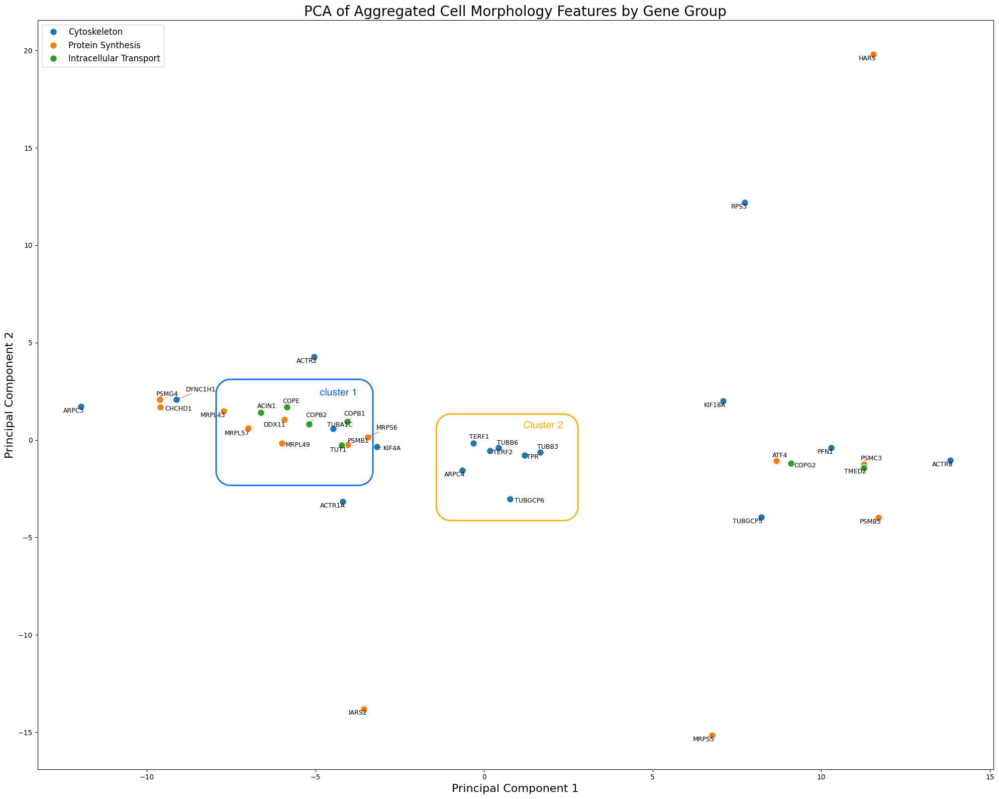

Figure 1




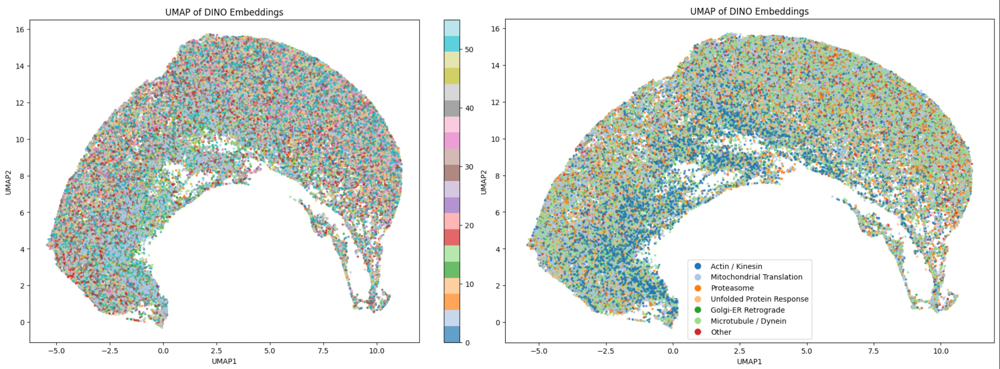

DINO Embedding Figure

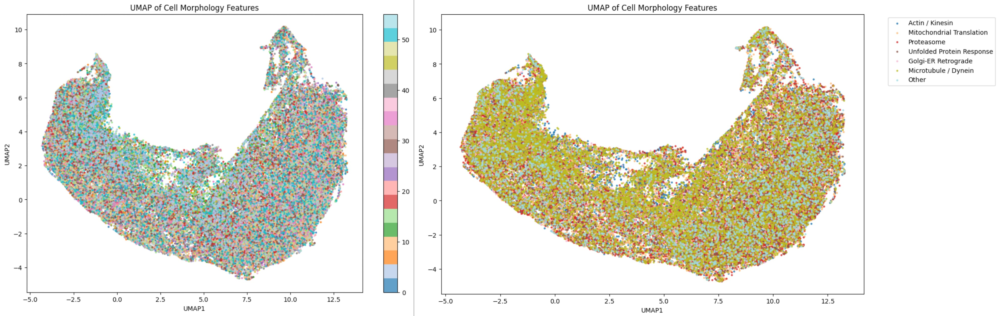

CellProfiler Features

In [ ]:
!pip install torch torchvision timm cellpose umap-learn scikit-learn matplotlib pandas seaborn tifffile dask dask-ml adjustText


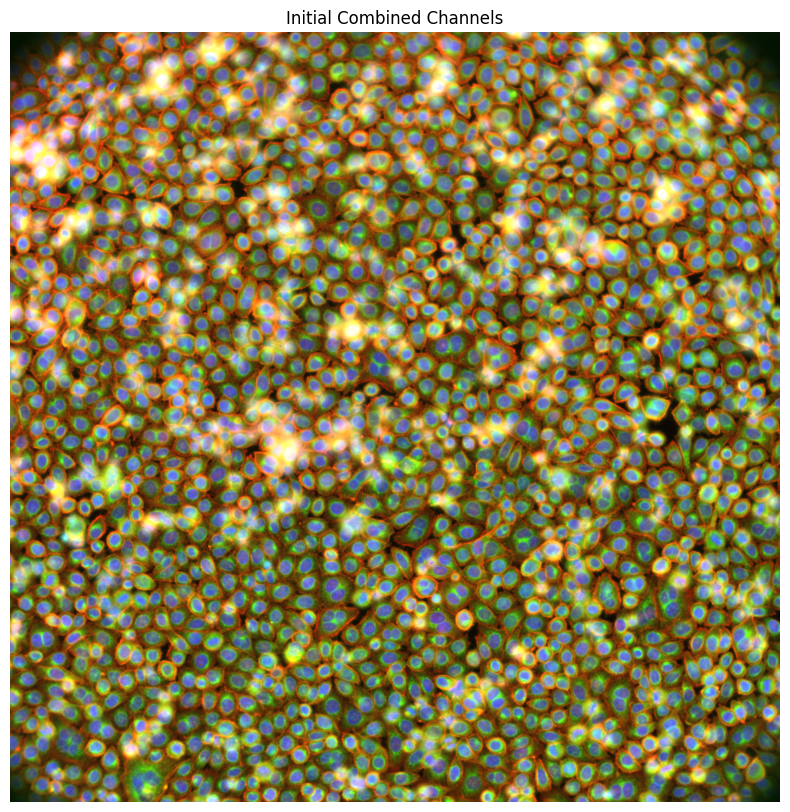

In [18]:
import os
import logging
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
from skimage import exposure

# Set up logging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Define the file paths for the five channels
tiff_files = [
    'ER.tiff',
    'WGA.tiff',
    'Phalloidin.tiff',
    'Mito.tiff',
    'DNA.tiff'
]

output_dir = 'output'

def create_combined_image(images, is_enhanced=False):
    # Define colors and weights for initial and enhanced images
    if is_enhanced:
        colors = [
            (0, 0.4, 0),    # Green for ER
            (0, 0.6, 0),    # Green for WGA
            (.9, 0, 0),     # Red for Phalloidin (Actin)
            (0, 0.5, 0),    # Green for Mitochondria
            (0, 0, .8)      # Blue for DNA
        ]
        weights = [1.4, 1.4, 2.7, 1.3, 1.9]
    else:
        colors = [
            (0, 0.4, 0),    # Darker Green for ER
            (0, 0.5, 0),    # Darker Cyan for WGA
            (0.9, 0, 0),    # Darker Red for Phalloidin (Actin)
            (0, 0.5, 0),    # Darker Yellow for Mitochondria
            (0, 0, 0.9)     # Darker Blue for DNA
        ]
        weights = [1.5, 1.6, 2.8, 1.5, 1.9]  # Equal weights for initial image

    # Normalize each channel individually
    normalized_images = [
        (img - np.min(img)) / (np.max(img) - np.min(img))
        for img in images
    ]

    combined_image = np.zeros((*images[0].shape, 3))
    for channel, color, weight in zip(normalized_images, colors, weights):
        for i in range(3):
            combined_image[:,:,i] += channel * color[i] * weight

    # Normalize the combined image
    combined_image = np.clip(combined_image, 0, 1)

    if is_enhanced:
        # Reduce green intensity for enhanced image
        combined_image[:,:,1] *= 1
    else:
        # Apply mild contrast enhancement for initial image
        combined_image = exposure.adjust_gamma(combined_image, .9)

    return combined_image

def main():
    logger.info("Starting main function")

    os.makedirs(output_dir, exist_ok=True)
    logger.info(f"Output directory: {output_dir}")

    # Load all images
    imgs = []
    for file_path in tiff_files:
        if not os.path.exists(file_path):
            logger.error(f"File not found: {file_path}")
            raise FileNotFoundError(f"File not found: {file_path}")
        img = tiff.imread(file_path)
        imgs.append(img)
        logger.info(f"File: {file_path}, Shape: {img.shape}, Data type: {img.dtype}")

    imgs = np.array(imgs)
    logger.info(f"Processing {len(imgs)} images")
    logger.info(f"Shape of imgs array: {imgs.shape}, dtype: {imgs.dtype}")

    # Create and visualize the initial combined image
    try:
        initial_combined_image = create_combined_image(imgs, is_enhanced=False)
        plt.figure(figsize=(10, 10))
        plt.imshow(initial_combined_image)
        plt.title('Initial Combined Channels')
        plt.axis('off')
        plt.savefig(os.path.join(output_dir, 'initial_combined_channels.png'), dpi=300, bbox_inches='tight')
        plt.show()
        logger.info("Initial combined image created and saved successfully")
    except Exception as e:
        logger.error(f"Error creating initial combined image: {str(e)}", exc_info=True)

    logger.info("Main function completed successfully")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        logger.error("An error occurred in the main function", exc_info=True)


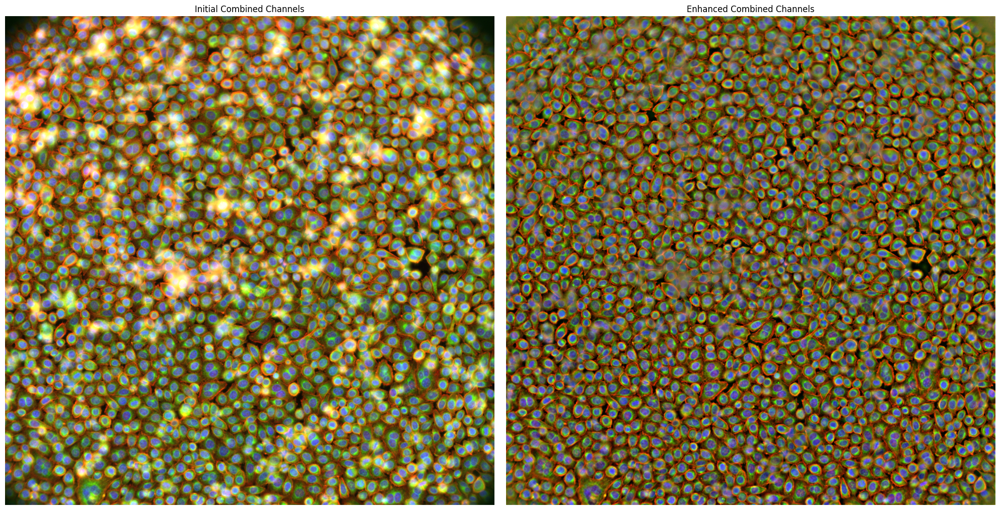

In [19]:
import os
import logging
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
from cellpose import denoise
from skimage import exposure, filters

# Set up logging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Define the file paths for the five channels
tiff_files = [
    'ER.tiff',
    'WGA.tiff',
    'Phalloidin.tiff',
    'Mito.tiff',
    'DNA.tiff'
]

output_dir = 'output'

def simple_illumination_correction(img, sigma=50, rescale=True):
    # Estimate the background
    background = filters.gaussian(img, sigma=sigma)
    # Correct the image
    corrected = img.astype(float) / (background + 1e-8)
    if rescale:
        # Rescale to [0, 1]
        corrected = (corrected - np.min(corrected)) / (np.max(corrected) - np.min(corrected))
    return corrected

def correct_illumination(img, channel_index):
    if channel_index in [0, 1, 3]:  # ER, WGA, Mito
        return simple_illumination_correction(img, sigma=10)
    elif channel_index == 2:  # Phalloidin
        return simple_illumination_correction(img, sigma=10)
    else:  # DNA
        return simple_illumination_correction(img, sigma=30)

def enhance_image(imgs):
    enhanced_images = []
    model = denoise.CellposeDenoiseModel(gpu=False, model_type="cyto3", restore_type="deblur_cyto3")
    for i, img in enumerate(imgs):
        img_corrected = correct_illumination(img, i)
        img_input = img_corrected[np.newaxis, ..., np.newaxis]
        _, _, _, img_dn = model.eval(img_input, diameter=30, channels=[0,0])
        img_deblurred = img_dn[..., 0]  # Remove channel dimension
        if img_deblurred.ndim != 2:
            img_deblurred = img_corrected
        img_deblurred = (img_deblurred - np.min(img_deblurred)) / (np.max(img_deblurred) - np.min(img_deblurred))
        enhanced_images.append(img_deblurred)
    return enhanced_images

def create_combined_image(images, is_enhanced=False):
    # Define colors and weights for initial and enhanced images
    if is_enhanced:
        colors = [
            (0, 0.4, 0),    # Green for ER
            (0, 0.6, 0),    # Green for WGA
            (.9, 0, 0),     # Red for Phalloidin (Actin)
            (0, 0.5, 0),    # Green for Mitochondria
            (0, 0, .8)      # Blue for DNA
        ]
        weights = [1.4, 1.5, 2.7, 1.3, 1.9]
    else:
        colors = [
            (0, 0.4, 0),    # Darker Green for ER
            (0, 0.5, 0),    # Darker Cyan for WGA
            (0.9, 0, 0),    # Darker Red for Phalloidin (Actin)
            (0, 0.5, 0),    # Darker Yellow for Mitochondria
            (0, 0, 0.9)     # Darker Blue for DNA
        ]
        weights = [1.5, 1.6, 2.8, 1.5, 1.9]  # Equal weights for initial image

    # Normalize each channel individually
    normalized_images = [
        (img - np.min(img)) / (np.max(img) - np.min(img))
        for img in images
    ]

    combined_image = np.zeros((*images[0].shape, 3))
    for channel, color, weight in zip(normalized_images, colors, weights):
        for i in range(3):
            combined_image[:,:,i] += channel * color[i] * weight

    # Normalize the combined image
    combined_image = np.clip(combined_image, 0, 1)

    if is_enhanced:
        # Reduce green intensity for enhanced image
        combined_image[:,:,1] *= 1
    else:
        # Apply mild contrast enhancement for initial image
        combined_image = exposure.adjust_gamma(combined_image, .9)

    return combined_image

def main():
    logger.info("Starting main function")

    os.makedirs(output_dir, exist_ok=True)
    logger.info(f"Output directory: {output_dir}")

    # Load all images
    imgs = []
    for file_path in tiff_files:
        if not os.path.exists(file_path):
            logger.error(f"File not found: {file_path}")
            raise FileNotFoundError(f"File not found: {file_path}")
        img = tiff.imread(file_path)
        imgs.append(img)
        logger.info(f"File: {file_path}, Shape: {img.shape}, Data type: {img.dtype}")

    imgs = np.array(imgs)
    logger.info(f"Processing {len(imgs)} images")
    logger.info(f"Shape of imgs array: {imgs.shape}, dtype: {imgs.dtype}")

    # Create and visualize the initial combined image
    try:
        initial_combined_image = create_combined_image(imgs, is_enhanced=False)
    except Exception as e:
        logger.error(f"Error creating initial combined image: {str(e)}", exc_info=True)

    # Process all images
    try:
        enhanced_images = enhance_image(imgs)
    except Exception as e:
        logger.error(f"Error in enhance_image: {str(e)}", exc_info=True)
        raise

    # Create and visualize the final combined image
    try:
        final_combined_image = create_combined_image(enhanced_images, is_enhanced=True)

        # Create a side-by-side comparison
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

        ax1.imshow(initial_combined_image)
        ax1.set_title('Initial Combined Channels')
        ax1.axis('off')

        ax2.imshow(final_combined_image)
        ax2.set_title('Enhanced Combined Channels')
        ax2.axis('off')

        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, 'combined_channels_comparison.png'), dpi=300, bbox_inches='tight')
        plt.show()
        logger.info("Combined image comparison created and saved successfully")
    except Exception as e:
        logger.error(f"Error creating combined image comparison: {str(e)}", exc_info=True)

    logger.info("Main function completed successfully")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        logger.error("An error occurred in the main function", exc_info=True)


Loading data from /content/drive/MyDrive/cellclub/CRISPR_Pooled_Screen/cellprofiles.csv...
Original DataFrame shape: (2246917, 3797)
Filtered DataFrame shape: (7588, 3797)
Created mapping for 498 images
Processing Plate_CP257J_Well_3_Site_4...
Processing Plate_CP257J_Well_3_Site_13...
Processing Plate_CP257J_Well_2_Site_41...
Processing Plate_CP257J_Well_4_Site_21...
Processing Plate_CP257J_Well_1_Site_6...


100%|██████████| 25.3M/25.3M [00:00<00:00, 68.1MB/s]
100%|██████████| 3.54k/3.54k [00:00<00:00, 6.11MB/s]
100%|██████████| 25.3M/25.3M [00:00<00:00, 72.7MB/s]
100%|██████████| 5.23k/5.23k [00:00<00:00, 6.76MB/s]
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 209MB/s]


Processing Plate_CP257J_Well_6_Site_98...
Processing Plate_CP257J_Well_3_Site_31...
Processing Plate_CP257J_Well_4_Site_3...
Processing Plate_CP257J_Well_1_Site_15...
Processing Plate_CP257J_Well_2_Site_23...
Processing Plate_CP257J_Well_1_Site_51...
Processing Plate_CP257J_Well_6_Site_89...
Processing Plate_CP257J_Well_3_Site_22...
Processing Plate_CP257J_Well_2_Site_50...
Processing Plate_CP257J_Well_2_Site_14...
Processing Plate_CP257J_Well_1_Site_42...
Processing Plate_CP257J_Well_3_Site_40...
Processing Plate_CP257J_Well_4_Site_12...
Processing Plate_CP257J_Well_1_Site_24...
Processing Plate_CP257J_Well_1_Site_60...
Processing Plate_CP257J_Well_1_Site_77...
Processing Plate_CP257J_Well_2_Site_49...
Processing Plate_CP257J_Well_5_Site_37...
Processing Plate_CP257J_Well_4_Site_65...
Processing Plate_CP257J_Well_3_Site_57...
Processing Plate_CP257J_Well_4_Site_29...
Processing Plate_CP257J_Well_2_Site_85...
Processing Plate_CP257J_Well_5_Site_73...
Processing Plate_CP257J_Well_6_Site

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


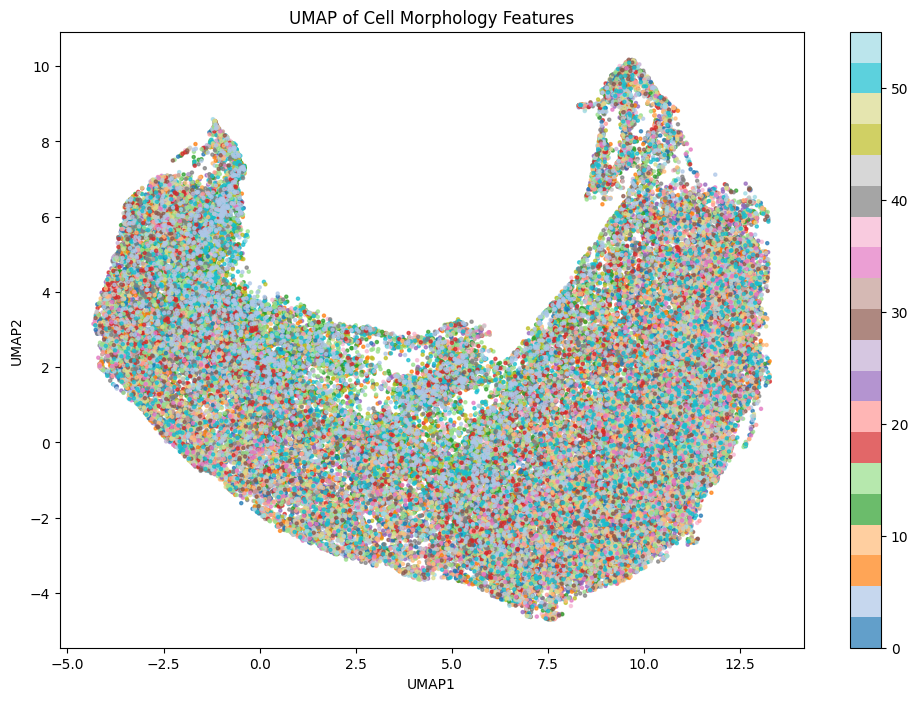

Analysis complete. UMAP visualization saved as 'umap_visualization.png'


In [ ]:
import os
import pandas as pd
import numpy as np
from typing import List, Dict, Tuple
import cv2
from cellpose import models
import torch
from torchvision.models import vit_b_16, ViT_B_16_Weights
from torchvision import transforms
from sklearn.preprocessing import StandardScaler
from umap import UMAP
import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of genes we're interested in
GENES_OF_INTEREST = [
    # Actin / Kinesin
    "ACTB", "ACTL6A", "ACTR10", "ACTR1A", "ACTR2", "ACTR6", "ACTR8", "ARPC3", "ARPC4",
    "KIF14", "KIF18A", "KIF23", "KIF4A", "KIF11", "NCKAP1", "PFDN1", "PFDN2", "PFDN5",
    "PFDN6", "PFN1", "RHOQ", "STRIP1", "TLN1",
    # Mitochondrial Translation
    "CHCHD1", "HARS", "IARS2", "MRPL10", "MRPL12", "MRPL16", "MRPL21", "MRPL27", "MRPL33",
    "MRPL38", "MRPL39", "MRPL4", "MRPL41", "MRPL43", "MRPL49", "MRPL53", "MRPL57", "MRPS11",
    "MRPS16", "MRPS21", "MRPS23", "MRPS5", "MRPS6", "PTCD3", "RARS2",
    # Proteasome
    "PSMA1", "PSMA2", "PSMA3", "PSMA4", "PSMA5", "PSMA6", "PSMA7", "PSMB1", "PSMB4",
    "PSMB5", "PSMB6", "PSMB7", "PSMC2", "PSMC3", "PSMC5", "PSMD2", "PSMD3", "PSMD4",
    "PSMD5", "PSMD6", "PSMD11", "PSMD13", "PSMG4",
    # Unfolded Protein Response
    "ATF4", "COPS5", "DDX11", "EIF2S1", "HSPA5", "HYOU1", "MBTPS1", "MBTPS2", "PPP1R15B", "ZBTB17",
    # Golgi-ER Retrograde
    "ARCN1", "CCDC115", "COPA", "COPB1", "COPB2", "COPE", "COPG1", "COPG2", "COPZ1",
    "GET3", "GOSR2", "PREB", "TMED2", "TMEM199",
    # Microtubule / Dynein
    "ARL2", "DYNC1H1", "DYNC1I2", "DYNL1RB1", "PAFAH1B1", "RAC1", "RPS3", "TERF1", "TERF2",
    "TPR", "TPT1", "TUBA1C", "TUBB", "TUBB2B", "TUBB3", "TUBB4A", "TUBB6", "TUBGCP2",
    "TUBGCP3", "TUBGCP4", "TUBGCP5", "TUBGCP6",
    # Other
    "ACIN1", "ACO2", "CCND1", "KIN", "RACK1", "TUT1", "VCP"
]

# Paths
csv_path = "cellprofiles.csv"
image_folder = "CP257J-Well1"

# Load and filter data
print(f"Loading data from {csv_path}...")
df = pd.read_csv(csv_path)
print(f"Original DataFrame shape: {df.shape}")

filtered_df = df[df['Metadata_Foci_Barcode_MatchedTo_GeneCode'].isin(GENES_OF_INTEREST)]
print(f"Filtered DataFrame shape: {filtered_df.shape}")

# Create image-gene mapping
image_gene_mapping = {}
for _, row in filtered_df.iterrows():
    foci_site_parts = row['Metadata_Foci_site'].split('-')
    if len(foci_site_parts) >= 3:
        image_id = f"Plate_{foci_site_parts[0]}_Well_{foci_site_parts[1][4:]}_Site_{foci_site_parts[2]}"
        gene = row['Metadata_Foci_Barcode_MatchedTo_GeneCode']
        image_gene_mapping[image_id] = gene

print(f"Created mapping for {len(image_gene_mapping)} images")

# Process images and extract features
all_genes = []
all_dino_embeddings = []
all_morph_features = []

channels = ['CorrDNA', 'CorrER', 'CorrMito', 'CorrPhalloidin', 'CorrWGA']

for image_id, gene in image_gene_mapping.items():
    print(f"Processing {image_id}...")
    combined_image = []

    for channel in channels:
        file_path = os.path.join(image_folder, f"{image_id}_{channel}.tiff")
        if os.path.exists(file_path):
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
            combined_image.append(img)

    if len(combined_image) != 5:
        print(f"Warning: Not all channels found for {image_id}")
        continue

    combined_image = np.stack(combined_image, axis=-1)

    # Segment nuclei
    nuclei_model = models.Cellpose(model_type='nuclei')
    nuclei_results = nuclei_model.eval(combined_image, diameter=None, channels=[0, 0])  # Assuming channel 0 is nuclei
    nuclei_masks = nuclei_results[0]

    # Segment cytoplasm
    cyto_model = models.Cellpose(model_type='cyto')
    cyto_results = cyto_model.eval(combined_image, diameter=None, channels=[0, 1])  # Adjust channels if needed
    cyto_masks = cyto_results[0]

    # Crop and mask cells using cytoplasm masks
    cell_images = []
    for cell_id in range(1, cyto_masks.max() + 1):
        cell_mask = cyto_masks == cell_id
        y, x = np.where(cell_mask)

        if len(y) == 0 or len(x) == 0:
            continue

        y_min, y_max = y.min(), y.max()
        x_min, x_max = x.min(), x.max()

        cropped_cell = combined_image[y_min:y_max+1, x_min:x_max+1].copy()
        cropped_mask = cell_mask[y_min:y_max+1, x_min:x_max+1]

        for c in range(cropped_cell.shape[-1]):
            cropped_cell[:, :, c] = cropped_cell[:, :, c] * cropped_mask

        cell_images.append(cropped_cell)

    if not cell_images:
        print(f"Warning: No cells found in {image_id}")
        continue

    # Extract DINO embeddings
    model = vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1)
    model.head = torch.nn.Identity()
    model.eval()

    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),  # Ensure resizing to 224x224
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    dino_embeddings = []
    for cell_image in cell_images:
        # Convert grayscale to RGB
        cell_image_rgb = np.stack((cell_image[:, :, 0],) * 3, axis=-1)
        input_tensor = preprocess(cell_image_rgb).unsqueeze(0)

        with torch.no_grad():
            embedding = model(input_tensor).squeeze().numpy()
        dino_embeddings.append(embedding)

    dino_embeddings = np.array(dino_embeddings)

    # Extract morphological features
    morph_features = []
    for cell_image in cell_images:
        # Example features: mean intensity, standard deviation, and area for each channel
        channel_features = []
        for c in range(cell_image.shape[-1]):
            channel = cell_image[:, :, c]
            channel_features.extend([
                np.mean(channel),
                np.std(channel),
                np.sum(channel > 0)  # Area
            ])
        morph_features.append(channel_features)
    morph_features = np.array(morph_features)

    all_genes.extend([gene] * len(cell_images))
    all_dino_embeddings.extend(dino_embeddings)
    all_morph_features.extend(morph_features)

all_dino_embeddings = np.array(all_dino_embeddings)
all_morph_features = np.array(all_morph_features)

# Combine features
scaler = StandardScaler()
scaled_dino = scaler.fit_transform(all_dino_embeddings)
scaled_morph = scaler.fit_transform(all_morph_features)
combined_features = np.hstack((scaled_dino, scaled_morph))

# Perform UMAP
umap_model = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embeddings = umap_model.fit_transform(combined_features)

# Visualize UMAP
plt.figure(figsize=(12, 8))
scatter = plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=pd.Categorical(all_genes).codes, cmap='tab20', s=5, alpha=0.7)
plt.colorbar(scatter)
plt.title('UMAP of Cell Morphology Features')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()
plt.savefig('umap_visualization.png', dpi=300, bbox_inches='tight')
plt.close()

print("Analysis complete. UMAP visualization saved as 'umap_visualization.png'")

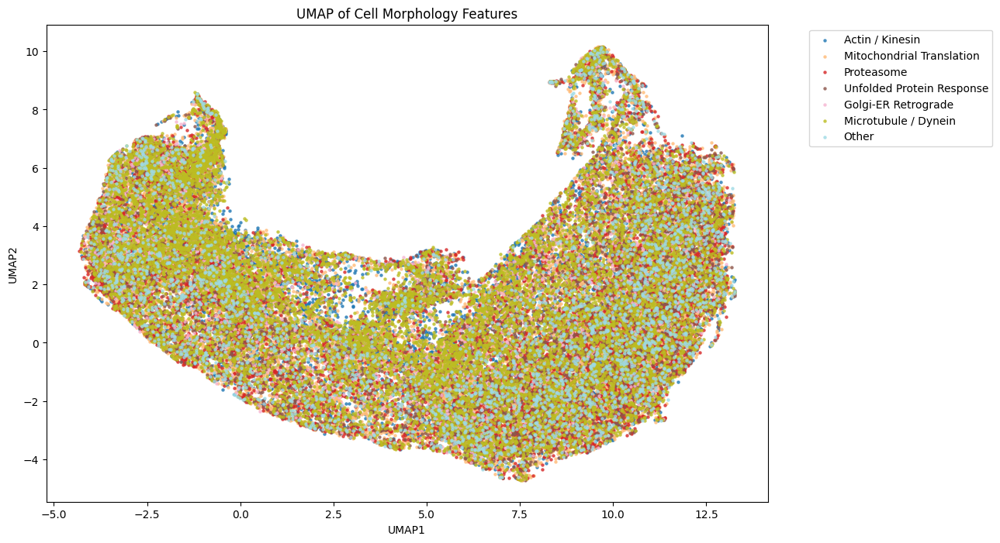

Updated UMAP visualization saved as 'umap_visualization.png'


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Define the list of genes we're interested in and their groups
GENE_GROUPS = {
    "Actin / Kinesin": ["ACTB", "ACTL6A", "ACTR10", "ACTR1A", "ACTR2", "ACTR6", "ACTR8", "ARPC3", "ARPC4", "KIF14", "KIF18A", "KIF23", "KIF4A", "KIF11", "NCKAP1", "PFDN1", "PFDN2", "PFDN5", "PFDN6", "PFN1", "RHOQ", "STRIP1", "TLN1"],
    "Mitochondrial Translation": ["CHCHD1", "HARS", "IARS2", "MRPL10", "MRPL12", "MRPL16", "MRPL21", "MRPL27", "MRPL33", "MRPL38", "MRPL39", "MRPL4", "MRPL41", "MRPL43", "MRPL49", "MRPL53", "MRPL57", "MRPS11", "MRPS16", "MRPS21", "MRPS23", "MRPS5", "MRPS6", "PTCD3", "RARS2"],
    "Proteasome": ["PSMA1", "PSMA2", "PSMA3", "PSMA4", "PSMA5", "PSMA6", "PSMA7", "PSMB1", "PSMB4", "PSMB5", "PSMB6", "PSMB7", "PSMC2", "PSMC3", "PSMC5", "PSMD2", "PSMD3", "PSMD4", "PSMD5", "PSMD6", "PSMD11", "PSMD13", "PSMG4"],
    "Unfolded Protein Response": ["ATF4", "COPS5", "DDX11", "EIF2S1", "HSPA5", "HYOU1", "MBTPS1", "MBTPS2", "PPP1R15B", "ZBTB17"],
    "Golgi-ER Retrograde": ["ARCN1", "CCDC115", "COPA", "COPB1", "COPB2", "COPE", "COPG1", "COPG2", "COPZ1", "GET3", "GOSR2", "PREB", "TMED2", "TMEM199"],
    "Microtubule / Dynein": ["ARL2", "DYNC1H1", "DYNC1I2", "DYNL1RB1", "PAFAH1B1", "RAC1", "RPS3", "TERF1", "TERF2", "TPR", "TPT1", "TUBA1C", "TUBB", "TUBB2B", "TUBB3", "TUBB4A", "TUBB6", "TUBGCP2", "TUBGCP3", "TUBGCP4", "TUBGCP5", "TUBGCP6"],
    "Other": ["ACIN1", "ACO2", "CCND1", "KIN", "RACK1", "TUT1", "VCP"]
}

# Create a mapping from each gene to its group
gene_to_group = {}
for group, genes in GENE_GROUPS.items():
    for gene in genes:
        gene_to_group[gene] = group

# Assign a unique color to each group
groups = list(GENE_GROUPS.keys())
num_groups = len(groups)
cmap = plt.get_cmap('tab20', num_groups)
group_colors = {group: cmap(i) for i, group in enumerate(groups)}

# Assuming all_genes and umap_embeddings are already defined from the previous steps
# all_genes = [...]  # List of genes corresponding to each point in the UMAP plot
# umap_embeddings = [...]  # 2D UMAP embeddings of the data

# Map genes to their groups
all_gene_groups = [gene_to_group[gene] for gene in all_genes]

# Plot UMAP
plt.figure(figsize=(12, 8))
for group, color in group_colors.items():
    indices = [i for i, g in enumerate(all_gene_groups) if g == group]
    plt.scatter(umap_embeddings[indices, 0], umap_embeddings[indices, 1], c=[color], label=group, s=5, alpha=0.7)

plt.title('UMAP of Cell Morphology Features')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('umap_visualization.png', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print("Updated UMAP visualization saved as 'umap_visualization.png'")


Performing UMAP on CellPose features...


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP on CellPose features complete.
Performing UMAP on DINO embeddings...


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP on DINO embeddings complete.


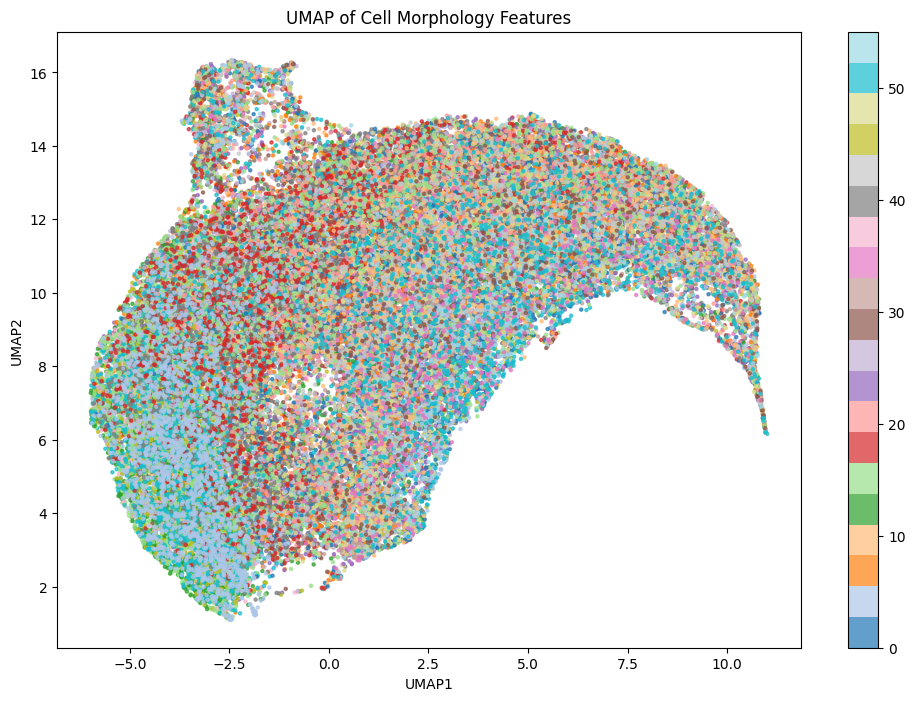

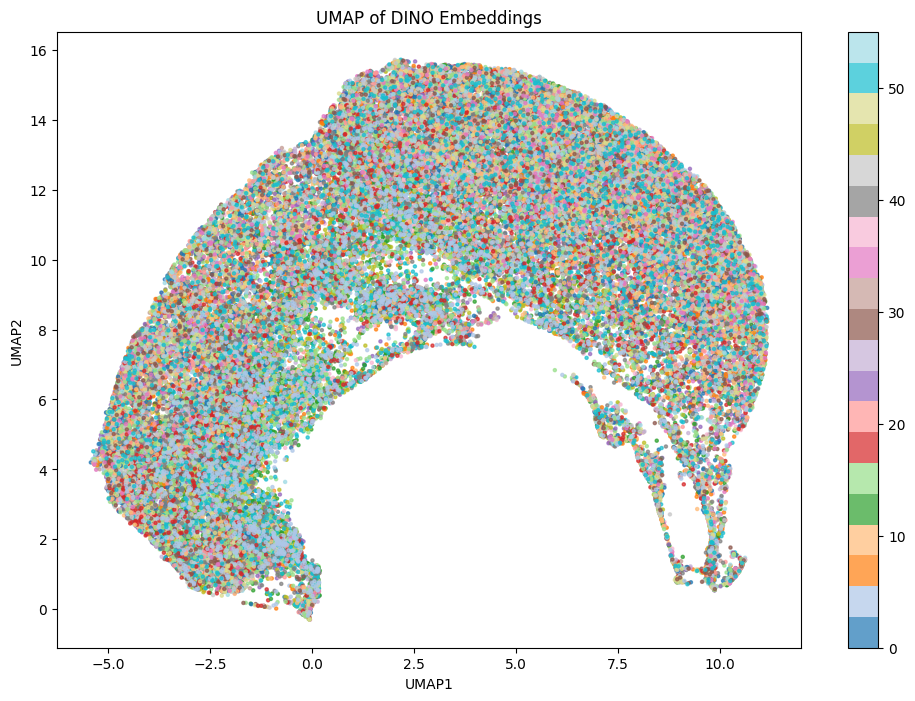

Analysis complete. UMAP visualizations saved as 'umap_morph_visualization.png' and 'umap_dino_visualization.png'


In [ ]:
print('Performing UMAP on CellProfiler features...')
umap_model = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_morph = umap_model.fit_transform(scaled_morph)
print('UMAP on CellProfiler features complete.')

# UMAP on DINO embeddings
print('Performing UMAP on DINO embeddings...')
umap_model = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_dino = umap_model.fit_transform(scaled_dino)
print('UMAP on DINO embeddings complete.')

# Visualize UMAP for CellProfiler features
plt.figure(figsize=(12, 8))
scatter = plt.scatter(umap_morph[:, 0], umap_morph[:, 1], c=pd.Categorical(all_genes).codes, cmap='tab20', s=5, alpha=0.7)
plt.colorbar(scatter)
plt.title('UMAP of Cell Morphology Features')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()
plt.savefig('umap_morph_visualization.png', dpi=300, bbox_inches='tight')
plt.close()

# Visualize UMAP for DINO embeddings
plt.figure(figsize=(12, 8))
scatter = plt.scatter(umap_dino[:, 0], umap_dino[:, 1], c=pd.Categorical(all_genes).codes, cmap='tab20', s=5, alpha=0.7)
plt.colorbar(scatter)
plt.title('UMAP of DINO Embeddings')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()
plt.savefig('umap_dino_visualization.png', dpi=300, bbox_inches='tight')
plt.close()

print("Analysis complete. UMAP visualizations saved as 'umap_morph_visualization.png' and 'umap_dino_visualization.png'")


Performing UMAP on CellPose features...


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP on CellPose features complete.
Performing UMAP on DINO embeddings...


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP on DINO embeddings complete.


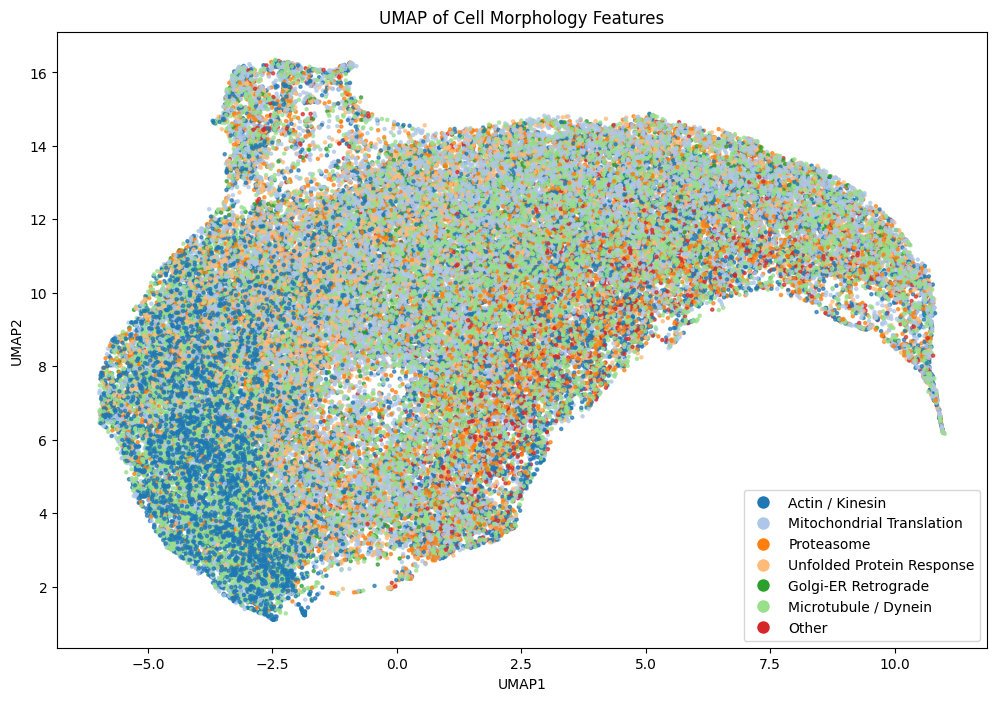

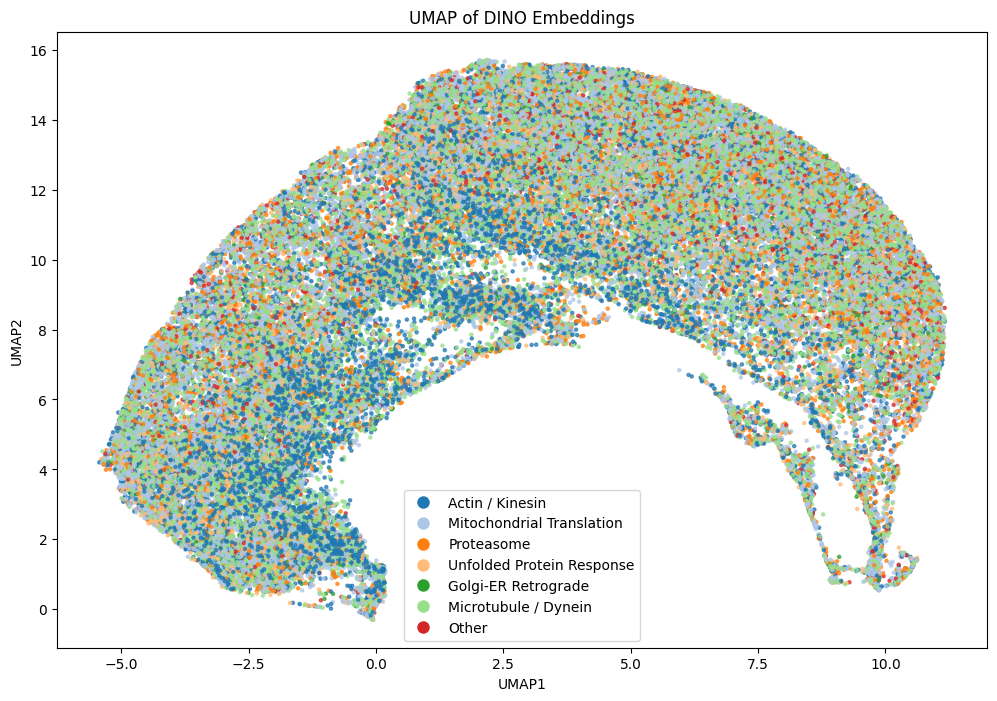

Analysis complete. UMAP visualizations saved as 'umap_morph_visualization.png' and 'umap_dino_visualization.png'


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from umap import UMAP
from sklearn.preprocessing import StandardScaler

# Assuming the variables `all_genes`, `all_dino_embeddings`, and `all_morph_features` are already defined

# Define gene groups
GENE_GROUPS = {
    "Actin / Kinesin": ["ACTB", "ACTL6A", "ACTR10", "ACTR1A", "ACTR2", "ACTR6", "ACTR8", "ARPC3", "ARPC4", "KIF14", "KIF18A", "KIF23", "KIF4A", "KIF11", "NCKAP1", "PFDN1", "PFDN2", "PFDN5", "PFDN6", "PFN1", "RHOQ", "STRIP1", "TLN1"],
    "Mitochondrial Translation": ["CHCHD1", "HARS", "IARS2", "MRPL10", "MRPL12", "MRPL16", "MRPL21", "MRPL27", "MRPL33", "MRPL38", "MRPL39", "MRPL4", "MRPL41", "MRPL43", "MRPL49", "MRPL53", "MRPL57", "MRPS11", "MRPS16", "MRPS21", "MRPS23", "MRPS5", "MRPS6", "PTCD3", "RARS2"],
    "Proteasome": ["PSMA1", "PSMA2", "PSMA3", "PSMA4", "PSMA5", "PSMA6", "PSMA7", "PSMB1", "PSMB4", "PSMB5", "PSMB6", "PSMB7", "PSMC2", "PSMC3", "PSMC5", "PSMD2", "PSMD3", "PSMD4", "PSMD5", "PSMD6", "PSMD11", "PSMD13", "PSMG4"],
    "Unfolded Protein Response": ["ATF4", "COPS5", "DDX11", "EIF2S1", "HSPA5", "HYOU1", "MBTPS1", "MBTPS2", "PPP1R15B", "ZBTB17"],
    "Golgi-ER Retrograde": ["ARCN1", "CCDC115", "COPA", "COPB1", "COPB2", "COPE", "COPG1", "COPG2", "COPZ1", "GET3", "GOSR2", "PREB", "TMED2", "TMEM199"],
    "Microtubule / Dynein": ["ARL2", "DYNC1H1", "DYNC1I2", "DYNL1RB1", "PAFAH1B1", "RAC1", "RPS3", "TERF1", "TERF2", "TPR", "TPT1", "TUBA1C", "TUBB", "TUBB2B", "TUBB3", "TUBB4A", "TUBB6", "TUBGCP2", "TUBGCP3", "TUBGCP4", "TUBGCP5", "TUBGCP6"],
    "Other": ["ACIN1", "ACO2", "CCND1", "KIN", "RACK1", "TUT1", "VCP"]
}

# Create a mapping from gene to group
gene_to_group = {gene: group for group, genes in GENE_GROUPS.items() for gene in genes}

# Assign groups to the genes
gene_groups = [gene_to_group[gene] for gene in all_genes]

# Normalize features
scaler = StandardScaler()
scaled_morph = scaler.fit_transform(all_morph_features)
scaled_dino = scaler.fit_transform(all_dino_embeddings)

# UMAP on CellProfiler features
print('Performing UMAP on CellProfiler features...')
umap_model_morph = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_morph = umap_model_morph.fit_transform(scaled_morph)
print('UMAP on CellProfiler features complete.')

# UMAP on DINO embeddings
print('Performing UMAP on DINO embeddings...')
umap_model_dino = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_dino = umap_model_dino.fit_transform(scaled_dino)
print('UMAP on DINO embeddings complete.')

# Define a color palette for the groups
palette = sns.color_palette("tab20", len(GENE_GROUPS))

# Create a mapping from group names to colors
group_colors = {group: palette[i] for i, group in enumerate(GENE_GROUPS.keys())}

# Assign colors to the genes based on their groups
colors = [group_colors[gene_to_group[gene]] for gene in all_genes]

# Visualize UMAP for CellProfiler features
plt.figure(figsize=(12, 8))
scatter = plt.scatter(umap_morph[:, 0], umap_morph[:, 1], c=colors, s=5, alpha=0.7)
plt.title('UMAP of Cell Morphology Features')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=group) for group, color in group_colors.items()])
plt.show()
plt.close()

# Visualize UMAP for DINO embeddings
plt.figure(figsize=(12, 8))
scatter = plt.scatter(umap_dino[:, 0], umap_dino[:, 1], c=colors, s=5, alpha=0.7)
plt.title('UMAP of DINO Embeddings')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=group) for group, color in group_colors.items()])
plt.show()
plt.close()

print("Analysis complete. UMAP visualizations saved as 'umap_morph_visualization.png' and 'umap_dino_visualization.png'")


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tifffile as tiff
from skimage.measure import regionprops, label
from skimage.feature import graycomatrix, graycoprops
from skimage import img_as_ubyte
from skimage.filters.rank import entropy
from skimage.morphology import disk
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import kurtosis, skew
from scipy.cluster.hierarchy import dendrogram, linkage
import time
import sys

# Directories and files
sccrops_output_dir = "cell_crops"
profiles_file = "filtered_data_with_nuclei_genes.csv"
output_dir = "output"

os.makedirs(output_dir, exist_ok=True)

# Load the cell profiles file
profiles_df = pd.read_csv(profiles_file)

# Create a dictionary mapping Metadata_Foci_site to Metadata_Foci_Barcode_MatchedTo_GeneCode
site_to_gene_mapping = dict(zip(profiles_df['Metadata_Foci_site'], profiles_df['Metadata_Foci_Barcode_MatchedTo_GeneCode']))

# Initialize a list to store all cell data
all_cell_data = []

def calculate_enhanced_shape_metrics(image, label_mask):
    props = regionprops(label_mask, intensity_image=image[:,:,0])
    if len(props) == 0:
        return None

    prop = props[0]

    # Existing metrics
    existing_metrics = {
        'max_feret_diameter': prop.feret_diameter_max,
        'aspect_ratio': prop.major_axis_length / prop.minor_axis_length if prop.minor_axis_length > 0 else 0,
        'circularity': (4 * np.pi * prop.area) / (prop.perimeter ** 2) if prop.perimeter > 0 else 0,
        'solidity': prop.solidity,
        'perimeter': prop.perimeter,
        'area': prop.area,
        'major_axis_length': prop.major_axis_length,
        'minor_axis_length': prop.minor_axis_length,
        'eccentricity': prop.eccentricity,
        'equivalent_diameter': prop.equivalent_diameter,
        'extent': prop.extent,
        'convex_area': prop.convex_area
    }

    # New shape metrics
    new_shape_metrics = {
        'compactness': np.sqrt(4 * prop.area / np.pi) / prop.major_axis_length if prop.major_axis_length > 0 else np.nan,
        'roundness': (4 * prop.area) / (np.pi * prop.major_axis_length ** 2) if prop.major_axis_length > 0 else np.nan,
        'elongation': prop.major_axis_length / prop.minor_axis_length if prop.minor_axis_length > 0 else np.nan,
        'orientation': prop.orientation,
        'euler_number': prop.euler_number,
        'perimeter_crofton': prop.perimeter_crofton,
        'fractal_dimension': 2 * np.log(prop.perimeter) / np.log(prop.area) if prop.area > 0 else np.nan
    }

    # Intensity metrics
    intensity_image = image[:,:,0]
    intensity_metrics = {
        'mean_intensity': prop.mean_intensity,
        'max_intensity': prop.max_intensity,
        'min_intensity': prop.min_intensity,
        'intensity_range': prop.max_intensity - prop.min_intensity,
        'std_intensity': np.std(intensity_image[label_mask > 0]),
        'intensity_kurtosis': kurtosis(intensity_image[label_mask > 0], axis=None),
        'intensity_skewness': skew(intensity_image[label_mask > 0], axis=None)
    }

    # Texture metrics
    glcm = graycomatrix(img_as_ubyte(intensity_image), [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], 256, symmetric=True, normed=True)
    texture_metrics = {
        'contrast': np.mean(graycoprops(glcm, 'contrast')),
        'dissimilarity': np.mean(graycoprops(glcm, 'dissimilarity')),
        'homogeneity': np.mean(graycoprops(glcm, 'homogeneity')),
        'energy': np.mean(graycoprops(glcm, 'energy')),
        'correlation': np.mean(graycoprops(glcm, 'correlation')),
        'ASM': np.mean(graycoprops(glcm, 'ASM'))
    }

    # Entropy
    entropy_val = entropy(img_as_ubyte(intensity_image), disk(5)).mean()

    # Moment invariants
    moments = prop.moments_hu
    moment_metrics = {f'moment_invariant_{i+1}': m for i, m in enumerate(moments)}

    # Combine all metrics
    all_metrics = {**existing_metrics, **new_shape_metrics, **intensity_metrics, **texture_metrics, **moment_metrics}
    all_metrics['entropy'] = entropy_val

    return all_metrics

def process_image_file(file_path):
    file_name = os.path.basename(file_path)
    try:
        # Read the image
        print(file_name)
        image = tiff.imread(file_path)
        label_mask = label(image[:, :, 0] > 0)

        # Extract site and channel information from the file name
        parts = file_name.split('_')
        well = parts[3]
        site_info = parts[5]
        channel = parts[6]
        plate = parts[1]
        info = f"{plate}-Well{well}-{site_info}"
        gene_name = site_to_gene_mapping.get(info, "Unknown")

        shape_metrics = calculate_enhanced_shape_metrics(image, label_mask)

        if shape_metrics is not None:
            cell_data = {'gene': gene_name, 'channel': channel}
            cell_data.update({f"{channel}_{key}": value for key, value in shape_metrics.items()})
            all_cell_data.append(cell_data)

        return True
    except Exception as e:
        print(f"Error processing file {file_name}: {str(e)}")
        return False

def get_files_in_chunks(directory, chunk_size=1000):
    all_files = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(('.tiff', '.tif')):
                all_files.append(os.path.join(root, file))
            if len(all_files) >= chunk_size:
                yield all_files
                all_files = []
    if all_files:
        print(f"Last chunk size: {len(all_files)}")
        yield all_files

# Process files in chunks
chunk_size = 1000
total_processed = 0
total_failed = 0
max_images = 100000

for chunk in get_files_in_chunks(sccrops_output_dir, chunk_size):
    if total_processed >= max_images:
        print(f"Reached the limit of {max_images} processed images.")
        break
    processed = 0
    failed = 0
    for file_path in chunk:
        if process_image_file(file_path):
            processed += 1
        else:
            failed += 1

    total_processed += processed
    total_failed += failed
    print(f"Processed {processed} files, failed {failed} files in this chunk.")
    print(f"Total processed: {total_processed}, Total failed: {total_failed}")

    # Add a small delay between chunks to avoid timeout
    time.sleep(1)

# Convert all_cell_data to DataFrame
df = pd.DataFrame(all_cell_data)

# Save the full data
df.to_csv(os.path.join(output_dir, 'all_cell_morphfeatures.csv'), index=False)
print(f"Full data shape: {df.shape}")
print(f"File size: {os.path.getsize(os.path.join(output_dir, 'all_cell_morphfeatures.csv')) / (1024 * 1024):.2f} MB")

# Prepare data for PCA
feature_columns = [col for col in df.columns if col not in ['gene', 'channel']]
X = df[feature_columns]

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_normalized)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['gene'] = df['gene']

# Plot PCA results
plt.figure(figsize=(12, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='gene', palette='deep', legend='full')
plt.title('PCA of Cell Morphology Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'pca_cell_morphology.png'))
plt.close()

print("PCA visualization completed and saved.")

# Feature importance
feature_importance = pd.DataFrame({
    'feature': feature_columns,
    'importance': np.sum(np.abs(pca.components_), axis=0)
}).sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('Top 20 Feature Importance in PCA')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'feature_importance.png'))
plt.close()

print("Feature importance plot saved.")

print("Performing hierarchical clustering...")

# Perform hierarchical clustering
linkage_matrix = linkage(X_normalized, method='ward')

# Plot dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix, labels=df['gene'], leaf_rotation=90, leaf_font_size=8)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Gene')
plt.ylabel('Distance')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'hierarchical_clustering_dendrogram.png'))
plt.close()

print("Hierarchical clustering dendrogram saved.")

# Optional: Cluster heatmap
print("Generating cluster heatmap...")

# Compute the correlation matrix
corr_matrix = pd.DataFrame(X_normalized, columns=feature_columns).corr()

# Perform hierarchical clustering on the correlation matrix
row_linkage = linkage(corr_matrix, method='ward')
col_linkage = linkage(corr_matrix.T, method='ward')

# Plot clustered heatmap
plt.figure(figsize=(20, 16))
sns.clustermap(corr_matrix, row_linkage=row_linkage, col_linkage=col_linkage,
               cmap='coolwarm', center=0, annot=False,
               figsize=(20, 16), xticklabels=True, yticklabels=True)
plt.title('Clustered Heatmap of Feature Correlations')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'clustered_heatmap.png'))
plt.close()

print("Clustered heatmap saved.")

# Optional: Gene clustering
print("Performing gene clustering...")

# Compute average feature values for each gene
gene_avg_features = df.groupby('gene')[feature_columns].mean()

# Perform hierarchical clustering on genes
gene_linkage = linkage(gene_avg_features, method='ward')

# Plot gene clustering dendrogram
plt.figure(figsize=(12, 8))
dendrogram(gene_linkage, labels=gene_avg_features.index, leaf_rotation=90, leaf_font_size=8)
plt.title('Gene Clustering Dendrogram')
plt.xlabel('Gene')
plt.ylabel('Distance')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'gene_clustering_dendrogram.png'))
plt.close()

print("Gene clustering dendrogram saved.")

print("All analyses completed. Check the output directory for results.")


<ipython-input-16-e6103e209c49>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_aggregated_cleaned.fillna(gene_aggregated_cleaned.median(), inplace=True)


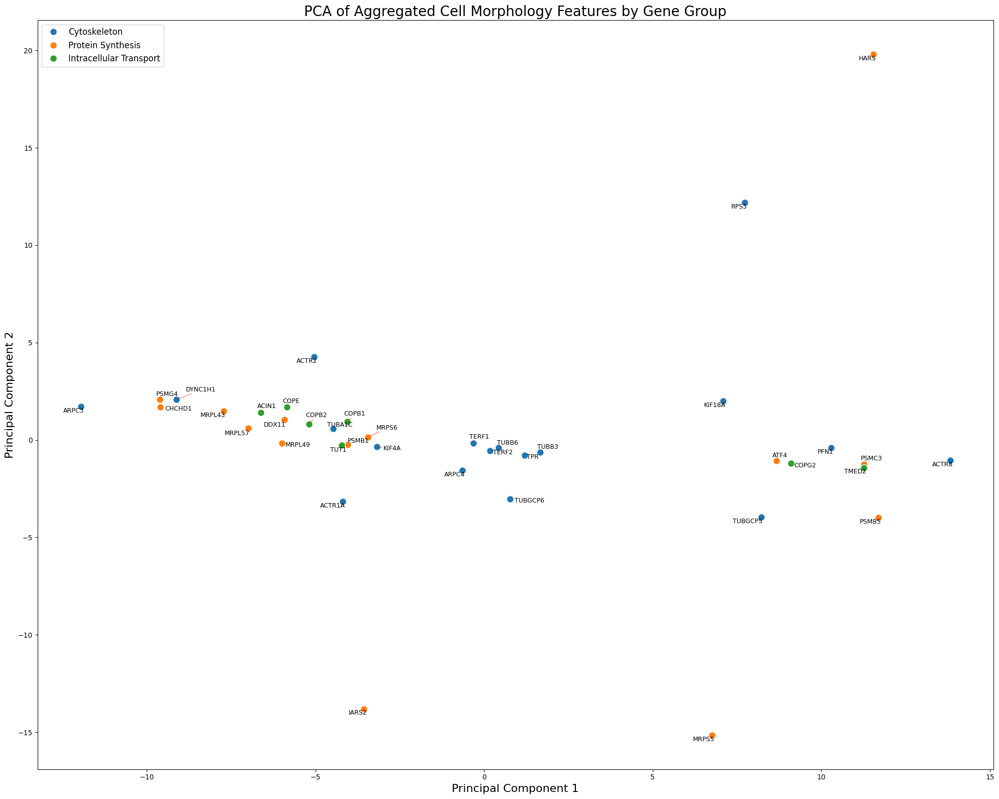

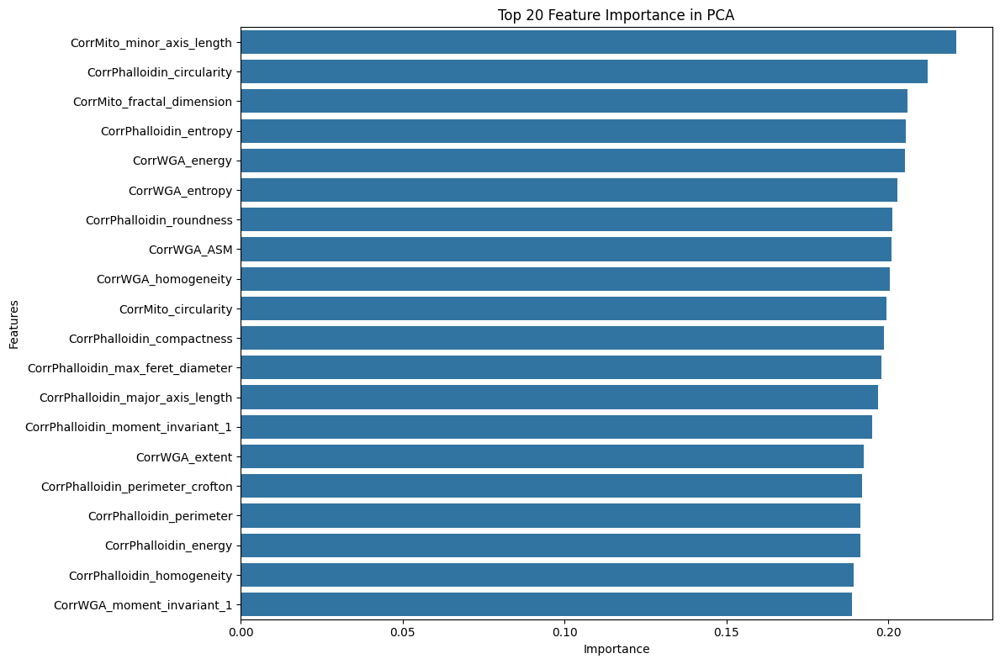

Performing hierarchical clustering...


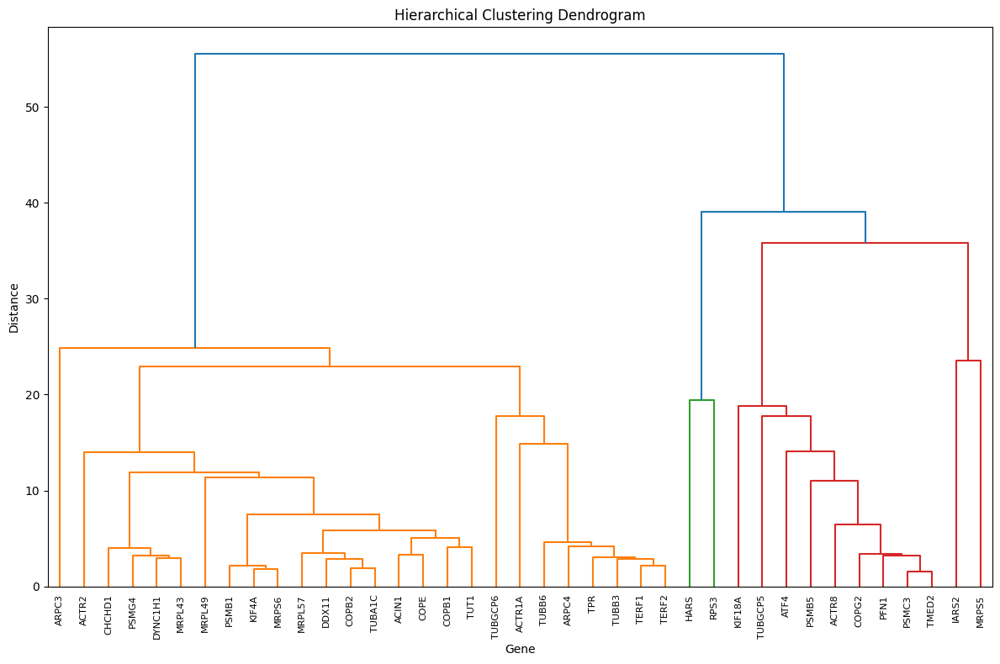

Generating cluster heatmap...


<Figure size 2000x1600 with 0 Axes>

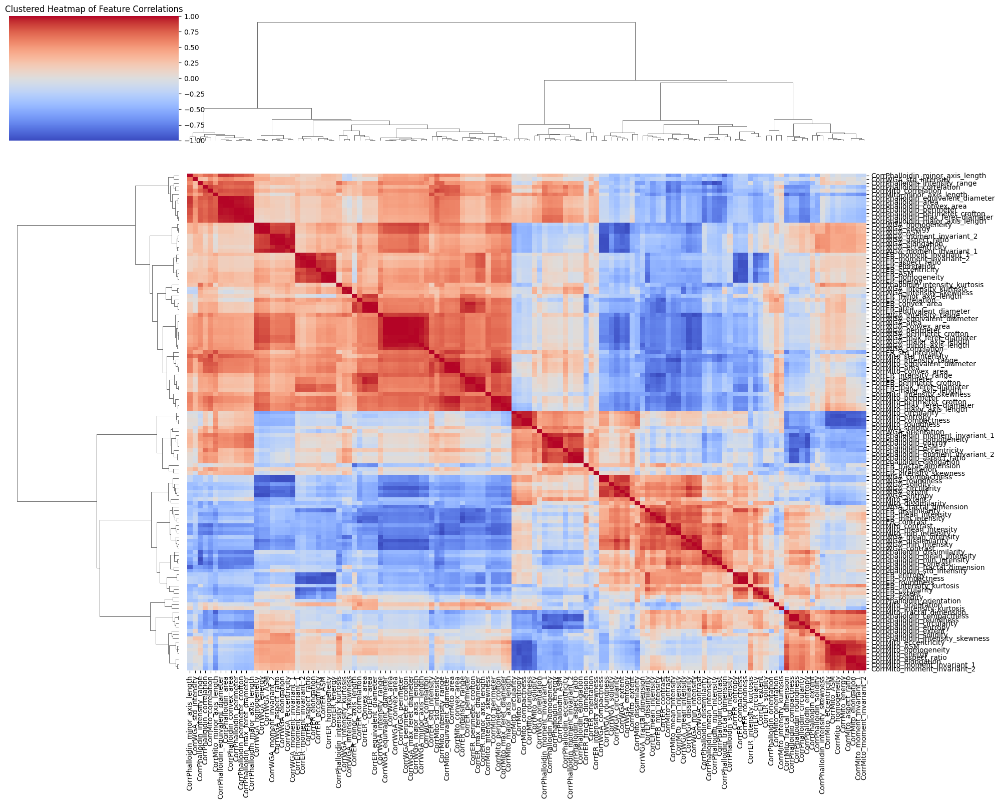

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from adjustText import adjust_text

# Load the CSV data from the specified path
file_path = 'all_cell_morphfeatures.csv'
df = pd.read_csv(file_path)

# Extract feature columns, excluding 'gene' and 'channel'
feature_columns = [col for col in df.columns if col not in ['gene', 'channel']]
X = df[feature_columns].copy()

# Replace infinity and very large values with NaN
X.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with the median of the column
X.fillna(X.median(), inplace=True)

# Aggregate the data by gene
gene_aggregated = df.groupby('gene')[feature_columns].median()

# Check for low variance features and remove them
variance_threshold = 1e-6  # Define a threshold for variance
low_variance_features = gene_aggregated.var() < variance_threshold
gene_aggregated_cleaned = gene_aggregated.loc[:, ~low_variance_features]

# Ensure all NaN values are filled with column median
gene_aggregated_cleaned.fillna(gene_aggregated_cleaned.median(), inplace=True)

# Standardize the aggregated data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(gene_aggregated_cleaned)

# Perform PCA on aggregated and cleaned data
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_normalized)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['gene'] = gene_aggregated_cleaned.index

# Define gene groups and their colors
GENES_GROUPED = [
    # Cytoskeleton and Cell Structure
    [
        "ACTB", "ACTL6A", "ACTR10", "ACTR1A", "ACTR2", "ACTR6", "ACTR8", "ARPC3", "ARPC4",
        "KIF14", "KIF18A", "KIF23", "KIF4A", "KIF11", "NCKAP1", "PFDN1", "PFDN2", "PFDN5",
        "PFDN6", "PFN1", "RHOQ", "STRIP1", "TLN1",
        "ARL2", "DYNC1H1", "DYNC1I2", "DYNL1RB1", "PAFAH1B1", "RAC1", "RPS3", "TERF1", "TERF2",
        "TPR", "TPT1", "TUBA1C", "TUBB", "TUBB2B", "TUBB3", "TUBB4A", "TUBB6", "TUBGCP2",
        "TUBGCP3", "TUBGCP4", "TUBGCP5", "TUBGCP6"
    ],
    # Protein Synthesis, Quality Control, and Degradation
    [
        "CHCHD1", "HARS", "IARS2", "MRPL10", "MRPL12", "MRPL16", "MRPL21", "MRPL27", "MRPL33",
        "MRPL38", "MRPL39", "MRPL4", "MRPL41", "MRPL43", "MRPL49", "MRPL53", "MRPL57", "MRPS11",
        "MRPS16", "MRPS21", "MRPS23", "MRPS5", "MRPS6", "PTCD3", "RARS2",
        "PSMA1", "PSMA2", "PSMA3", "PSMA4", "PSMA5", "PSMA6", "PSMA7", "PSMB1", "PSMB4",
        "PSMB5", "PSMB6", "PSMB7", "PSMC2", "PSMC3", "PSMC5", "PSMD2", "PSMD3", "PSMD4",
        "PSMD5", "PSMD6", "PSMD11", "PSMD13", "PSMG4",
        "ATF4", "COPS5", "DDX11", "EIF2S1", "HSPA5", "HYOU1", "MBTPS1", "MBTPS2", "PPP1R15B", "ZBTB17"
    ],
    # Intracellular Transport, Organelle Function, and Cell Cycle
    [
        "ARCN1", "CCDC115", "COPA", "COPB1", "COPB2", "COPE", "COPG1", "COPG2", "COPZ1",
        "GET3", "GOSR2", "PREB", "TMED2", "TMEM199",
        "ACIN1", "ACO2", "CCND1", "KIN", "RACK1", "TUT1", "VCP"
    ]
]

colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Blue, Orange, Green
group_names = ['Cytoskeleton', 'Protein Synthesis', 'Intracellular Transport']
# Create a dictionary for gene to color mapping
gene_color_mapping = {}
for group, color in zip(GENES_GROUPED, colors):
    for gene in group:
        gene_color_mapping[gene] = color

# Assign colors to each gene in the PCA DataFrame
pca_df['color'] = pca_df['gene'].map(gene_color_mapping)

# Plot PCA results with assigned colors and gene names
plt.figure(figsize=(20, 16))  # Increased figure size
ax = plt.gca()

texts = []  # List to store text objects for adjustment

for gene, color in gene_color_mapping.items():
    gene_data = pca_df[pca_df['gene'] == gene]
    ax.scatter(gene_data['PC1'], gene_data['PC2'], color=color, label=gene, edgecolors='w', s=100)
    for _, row in gene_data.iterrows():
        texts.append(ax.text(row['PC1'], row['PC2'], row['gene'], fontsize=9, ha='center', va='center'))

# Adjust text positions to minimize overlaps
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red', lw=0.5))

plt.title('PCA of Aggregated Cell Morphology Features by Gene Group', fontsize=20)
plt.xlabel('Principal Component 1', fontsize=16)
plt.ylabel('Principal Component 2', fontsize=16)

# Add a legend with descriptive group names
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=group_name,
                              markerfacecolor=color, markersize=10)
                   for group_name, color in zip(group_names, colors)]
plt.legend(handles=legend_elements, loc='best', fontsize=12)

plt.tight_layout()
plt.show()
plt.close()


# Feature importance
feature_importance = pd.DataFrame({
    'feature': gene_aggregated_cleaned.columns,
    'importance': np.sum(np.abs(pca.components_), axis=0)
}).sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('Top 20 Feature Importance in PCA')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.tight_layout()
plt.show()
plt.close()

print("Performing hierarchical clustering...")

# Perform hierarchical clustering
linkage_matrix = linkage(X_normalized, method='ward')

# Plot dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix, labels=gene_aggregated_cleaned.index, leaf_rotation=90, leaf_font_size=8)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Gene')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()
plt.close()

# Optional: Cluster heatmap
print("Generating cluster heatmap...")

# Compute the correlation matrix
corr_matrix = pd.DataFrame(X_normalized, columns=gene_aggregated_cleaned.columns).corr()

# Perform hierarchical clustering on the correlation matrix
row_linkage = linkage(corr_matrix, method='ward')
col_linkage = linkage(corr_matrix.T, method='ward')

# Plot clustered heatmap
plt.figure(figsize=(20, 16))
sns.clustermap(corr_matrix, row_linkage=row_linkage, col_linkage=col_linkage,
               cmap='coolwarm', center=0, annot=False,
               figsize=(20, 16), xticklabels=True, yticklabels=True)
plt.title('Clustered Heatmap of Feature Correlations')
plt.tight_layout()
plt.show()
plt.close()